In [1]:
file_path = 'CJ032_Q2.wav'

In [2]:
import librosa.display
import numpy as np
x,sr = librosa.load(file_path)
print(x.shape, sr)

(1279782,) 22050


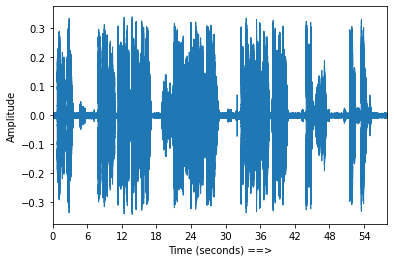

In [3]:
from librosa import display
import matplotlib.pyplot as plt
plt.figure()
librosa.display.waveplot(y=x, sr=sr)
plt.xlabel("Time (seconds) ==>")
plt.ylabel("Amplitude")
plt.show()

In [4]:
from IPython.display import Audio
Audio(file_path)

In [5]:
y=librosa.amplitude_to_db(abs(x))
refDBVal = np.max(y)
print(x)

[-0.00182422 -0.00237041 -0.00112883 ...  0.          0.
  0.        ]


In [6]:
# short time fourier transform
# (n_fft and hop length determine frequency/time resolution)
n_fft = 2048
S = librosa.stft(x, n_fft=n_fft, hop_length=n_fft//2)
print(S.shape)
# convert to db
D = librosa.amplitude_to_db(np.abs(S), ref=np.max)
np.max(abs(D))

(1025, 1250)


80.0

In [7]:
def displayTime(startFrame, endFrame):
    print( '  start time: ' + str(startFrame/sr) + ', end time: ' + str(endFrame/sr))


In [8]:
nonMuteSections = librosa.effects.split(y=x,top_db=20,frame_length=2048,hop_length=1024)  # split audio with any audio signal lesser than 20db as mute
nonMuteSections

array([[  15360,   21504],
       [  22528,   29696],
       [  30720,   49152],
       [  53248,   74752],
       [ 172032,  222208],
       [ 223232,  225280],
       [ 226304,  237568],
       [ 246784,  266240],
       [ 267264,  278528],
       [ 279552,  295936],
       [ 300032,  329728],
       [ 331776,  374784],
       [ 418816,  419840],
       [ 420864,  423936],
       [ 425984,  432128],
       [ 433152,  436224],
       [ 442368,  444416],
       [ 446464,  450560],
       [ 452608,  453632],
       [ 456704,  487424],
       [ 488448,  567296],
       [ 568320,  582656],
       [ 586752,  627712],
       [ 717824,  733184],
       [ 737280,  776192],
       [ 777216,  827392],
       [ 838656,  897024],
       [ 967680,  976896],
       [ 977920,  987136],
       [ 988160,  992256],
       [1003520, 1009664],
       [1010688, 1014784],
       [1015808, 1029120],
       [1035264, 1044480],
       [1132544, 1138688],
       [1139712, 1146880],
       [1148928, 1156096],
 

In [9]:
for i in nonMuteSections:
    displayTime(i[0],i[1])

  start time: 0.6965986394557823, end time: 0.9752380952380952
  start time: 1.0216780045351475, end time: 1.3467573696145125
  start time: 1.3931972789115645, end time: 2.2291156462585033
  start time: 2.414875283446712, end time: 3.3901133786848074
  start time: 7.801904761904762, end time: 10.077460317460318
  start time: 10.12390022675737, end time: 10.216780045351474
  start time: 10.263219954648527, end time: 10.7740589569161
  start time: 11.19201814058957, end time: 12.07437641723356
  start time: 12.120816326530612, end time: 12.631655328798185
  start time: 12.678095238095239, end time: 13.421133786848072
  start time: 13.606893424036281, end time: 14.953650793650795
  start time: 15.046530612244897, end time: 16.99700680272109
  start time: 18.99392290249433, end time: 19.040362811791383
  start time: 19.086802721088436, end time: 19.22612244897959
  start time: 19.319002267573698, end time: 19.59764172335601
  start time: 19.644081632653062, end time: 19.783401360544218
  s

In [10]:
import soundfile as sf

In [13]:
# reform the audio after removing the silence sections
wav_data = []
for c in nonMuteSections:
    print(c)
    data = x[c[0]: c[1]]
    wav_data.extend(data)
    sf.write('CJ032_Q2_nonmute.wav', wav_data, sr)

[15360 21504]
[22528 29696]
[30720 49152]
[53248 74752]
[172032 222208]
[223232 225280]
[226304 237568]
[246784 266240]
[267264 278528]
[279552 295936]
[300032 329728]
[331776 374784]
[418816 419840]
[420864 423936]
[425984 432128]
[433152 436224]
[442368 444416]
[446464 450560]
[452608 453632]
[456704 487424]
[488448 567296]
[568320 582656]
[586752 627712]
[717824 733184]
[737280 776192]
[777216 827392]
[838656 897024]
[967680 976896]
[977920 987136]
[988160 992256]
[1003520 1009664]
[1010688 1014784]
[1015808 1029120]
[1035264 1044480]
[1132544 1138688]
[1139712 1146880]
[1148928 1156096]
[1177600 1183744]
[1185792 1189888]
[1190912 1199104]


In [21]:
file_path[:8]

'CJ032_Q2'

In [22]:
# create wav file for each non mute section , we aimed to use them in the classification 

i=1
for c in nonMuteSections:
    data=[]
    wav_data = []
    data = x[c[0]: c[1]]
    name=file_path[:8]+'_part_'+str(i)+'.wav'
    wav_data.extend(data)
    sf.write('sections/'+name, wav_data, sr)
    i+=1
    